In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import pandas as pd

In [2]:
np.random.seed(1)
tf.random.set_seed(346)

# load json and create model
json_file = open('../outputs/model_model_A.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = keras.models.model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights('../outputs/model_model_A.h5')

# evaluate loaded model on test data
opt = keras.optimizers.SGD(learning_rate=0.01)
loaded_model.compile(optimizer=opt, loss="sparse_categorical_crossentropy", metrics=["accuracy"])

In [3]:
#train = np.zeros((10000*10,51,153))
test = np.zeros((1000*10,51,153))

#train_targ = np.zeros((10000*10))
test_targ = np.zeros((1000*10))

#train_ID = np.zeros((10000*10))
test_ID = np.zeros((1000*10))

#init_len_tr = 0
init_len_te = 0
for ii in range(10):
    test_full= np.load('../data/data_split/test%d'%ii+'.npy') 
     
    test_targ_full= np.load('../data/data_split/test_targ_%d'%ii+'.npy')
    
    test_ID_full= np.load('../data/data_split/test_ID_%d'%ii+'.npy') 
    
    np.random.seed(3)
    random_index_test = np.random.choice(len(test_full), size=1000, replace=False)

    
    tests = test_full[random_index_test,:,:]
    test[init_len_te:init_len_te+len(random_index_test)] = tests
    
    tests_targ = test_targ_full[random_index_test]
    test_targ[init_len_te:init_len_te+len(random_index_test)] = tests_targ
    
    tests_id = test_ID_full[random_index_test]
    test_ID[init_len_te:init_len_te+len(random_index_test)] = tests_id
    
    init_len_te = init_len_te + len(random_index_test)
    

    test_full = None
    test_targ_full = None
    test_ID_full = None
    tests = None
    tests_id = None
    
    print("Done with {}".format(ii))

Done with 0
Done with 1
Done with 2
Done with 3
Done with 4
Done with 5
Done with 6
Done with 7
Done with 8
Done with 9


array([[9.4924651e-02, 9.0507537e-01],
       [7.4851210e-04, 9.9925143e-01],
       [1.6330711e-03, 9.9836689e-01],
       ...,
       [6.4498076e-04, 9.9935502e-01],
       [9.9999785e-01, 2.1818535e-06],
       [9.9999106e-01, 8.9601645e-06]], dtype=float32)

In [4]:
test_ID = test_ID.astype(int)
test_targ = test_targ.astype(int)

# -- data frame ID and Object_type
df_test = pd.DataFrame({'ID':test_ID, 'OBJECT_TYPE':test_targ})
df_test

# -- predict test in model_AA
feat_te2 = test.reshape(len(test), 51, 153, 1)
y_pred_test = loaded_model.predict(feat_te2)
df_test["predicted"] = np.argmax(y_pred_test,axis=1)
df_test

,ID,OBJECT_TYPE,predicted
0,11356276,1,1
1,9412560,1,1
2,8540062,1,1
3,10149330,0,0
4,7789880,1,1
...,...,...,...
9995,9476886,0,1
9996,11279388,0,0
9997,7921827,1,1
9998,10085008,0,0


In [23]:
y_pred_test[413]

array([0.5154183 , 0.48458168], dtype=float32)

### Labeled as bogus (1) and predicted as real (0)

In [15]:
df_test_mssbogus = df_test[(df_test["OBJECT_TYPE"] == 1) & (df_test["predicted"] == 0)]
print(len(df_test_mssbogus))

169


In [26]:
df_test_mssbogus

,ID,OBJECT_TYPE,predicted
74,7784144,1,0
219,6969272,1,0
246,8987477,1,0
350,7830832,1,0
351,7781527,1,0
...,...,...,...
9323,10317772,1,0
9373,10187918,1,0
9497,8573229,1,0
9655,10354228,1,0


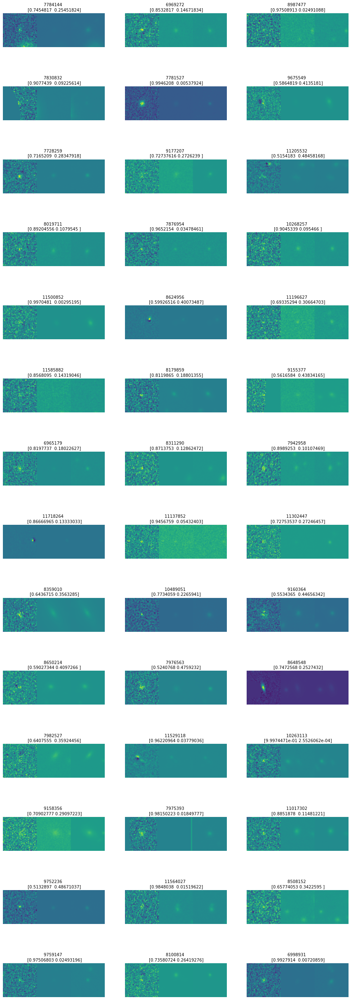

In [29]:
fig, ax = plt.subplots(14,3, figsize = (15,45))
#fig.subplots_adjust(0, 0, 0.5, 1, 0, 1)

for i in range(14*3):
    ax[i//3,i%3].axis("off")
    ax[i//3,i%3].imshow(test[df_test_mssbogus.index.to_numpy()[i]])
    ax[i//3,i%3].set_title("{} \n {}".format(df_test_mssbogus.loc[df_test_mssbogus.index.to_numpy()[i]]["ID"],y_pred_test[df_test_mssbogus.index.to_numpy()[i]] ), fontsize = 10)  
    
#plt.savefig("tests1.pdf",bbox_inches="tight")

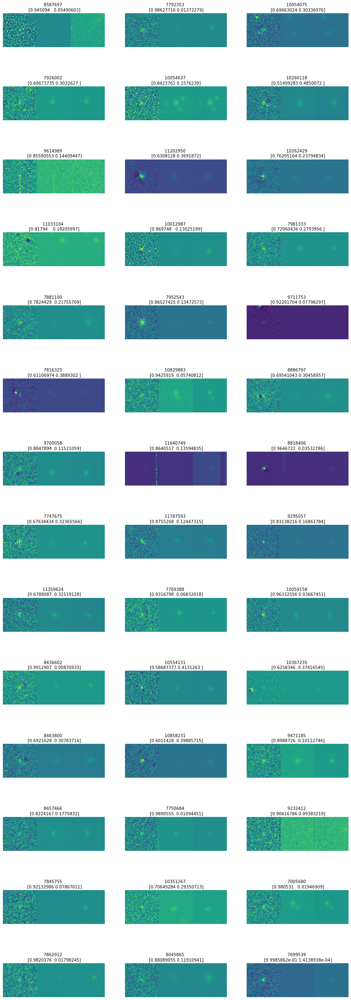

In [30]:
fig, ax = plt.subplots(14,3, figsize = (15,45))
#fig.subplots_adjust(0, 0, 0.5, 1, 0, 1)

for i in range(14*3):
    ax[i//3,i%3].axis("off")
    ax[i//3,i%3].imshow(test[df_test_mssbogus.index.to_numpy()[i+42]])
    ax[i//3,i%3].set_title("{} \n {}".format(df_test_mssbogus.loc[df_test_mssbogus.index.to_numpy()[i+42]]["ID"],y_pred_test[df_test_mssbogus.index.to_numpy()[i+42]] ), fontsize = 10)  
#plt.savefig("tests2.pdf",bbox_inches="tight")

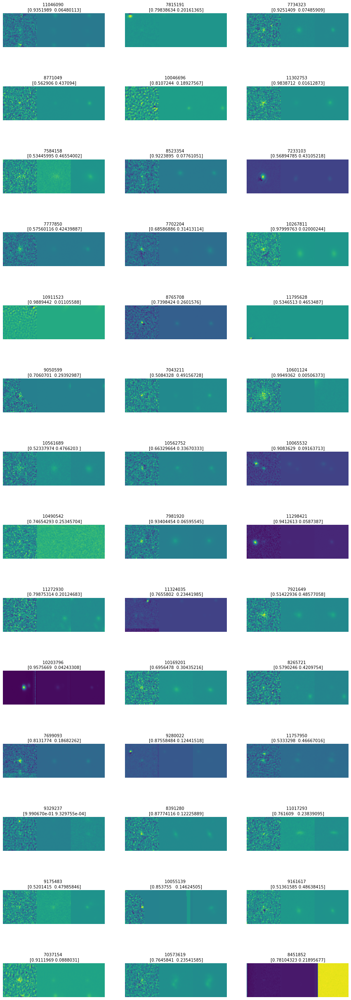

In [31]:
fig, ax = plt.subplots(14,3, figsize = (15,45))
#fig.subplots_adjust(0, 0, 0.5, 1, 0, 1)

for i in range(14*3):
    ax[i//3,i%3].axis("off")
    ax[i//3,i%3].imshow(test[df_test_mssbogus.index.to_numpy()[i+84]])
    ax[i//3,i%3].set_title("{} \n {}".format(df_test_mssbogus.loc[df_test_mssbogus.index.to_numpy()[i+84]]["ID"],y_pred_test[df_test_mssbogus.index.to_numpy()[i+84]] ), fontsize = 10)  
#plt.savefig("tests3.pdf",bbox_inches="tight")

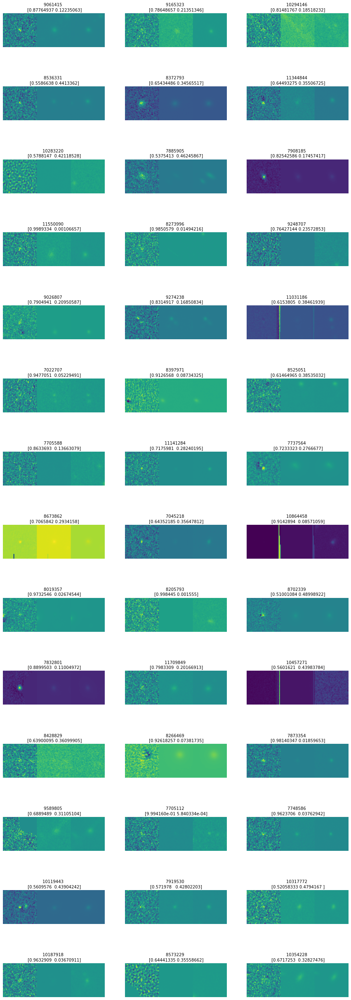

In [32]:
fig, ax = plt.subplots(14,3, figsize = (15,45))
#fig.subplots_adjust(0, 0, 0.5, 1, 0, 1)

for i in range(14*3):
    ax[i//3,i%3].axis("off")
    ax[i//3,i%3].imshow(test[df_test_mssbogus.index.to_numpy()[i+126]])
    ax[i//3,i%3].set_title("{} \n {}".format(df_test_mssbogus.loc[df_test_mssbogus.index.to_numpy()[i+126]]["ID"],y_pred_test[df_test_mssbogus.index.to_numpy()[i+126]] ), fontsize = 10)  
#plt.savefig("tests4.pdf",bbox_inches="tight")

### Labeled as real (0) and predicted as bogus (1)

In [33]:
df_test_mssreal = df_test[(df_test["OBJECT_TYPE"] == 0) & (df_test["predicted"] == 1)]
print(len(df_test_mssreal))

254


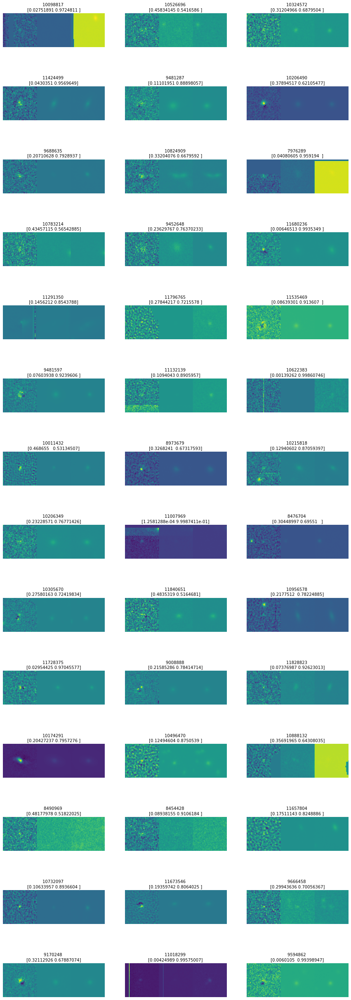

In [35]:
fig, ax = plt.subplots(14,3, figsize = (15,45))
#fig.subplots_adjust(0, 0, 0.5, 1, 0, 1)

for i in range(14*3):
    ax[i//3,i%3].axis("off")
    ax[i//3,i%3].imshow(test[df_test_mssreal.index.to_numpy()[i]])
    ax[i//3,i%3].set_title("{} \n {} ".format(df_test_mssreal.loc[df_test_mssreal.index.to_numpy()[i]]["ID"],y_pred_test[df_test_mssreal.index.to_numpy()[i]] ), fontsize = 10)  
#plt.savefig("tests1.pdf",bbox_inches="tight")

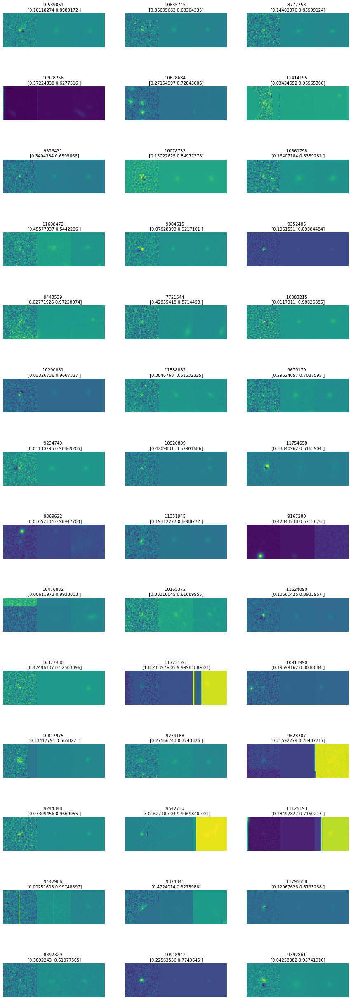

In [36]:
fig, ax = plt.subplots(14,3, figsize = (15,45))
#fig.subplots_adjust(0, 0, 0.5, 1, 0, 1)

for i in range(14*3):
    ax[i//3,i%3].axis("off")
    ax[i//3,i%3].imshow(test[df_test_mssreal.index.to_numpy()[i+42]])
    ax[i//3,i%3].set_title("{} \n {}".format(df_test_mssreal.loc[df_test_mssreal.index.to_numpy()[i+42]]["ID"],y_pred_test[df_test_mssreal.index.to_numpy()[i+42]] ), fontsize = 10)  
#plt.savefig("tests2.pdf",bbox_inches="tight")

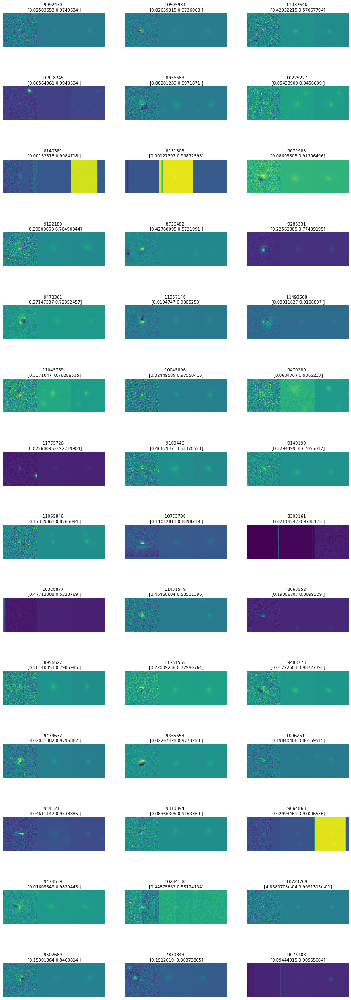

In [37]:
fig, ax = plt.subplots(14,3, figsize = (15,45))
#fig.subplots_adjust(0, 0, 0.5, 1, 0, 1)

for i in range(14*3):
    ax[i//3,i%3].axis("off")
    ax[i//3,i%3].imshow(test[df_test_mssreal.index.to_numpy()[i+84]])
    ax[i//3,i%3].set_title("{} \n {}".format(df_test_mssreal.loc[df_test_mssreal.index.to_numpy()[i+84]]["ID"],y_pred_test[df_test_mssreal.index.to_numpy()[i+84]] ), fontsize = 10)  
#plt.savefig("tests3.pdf",bbox_inches="tight")

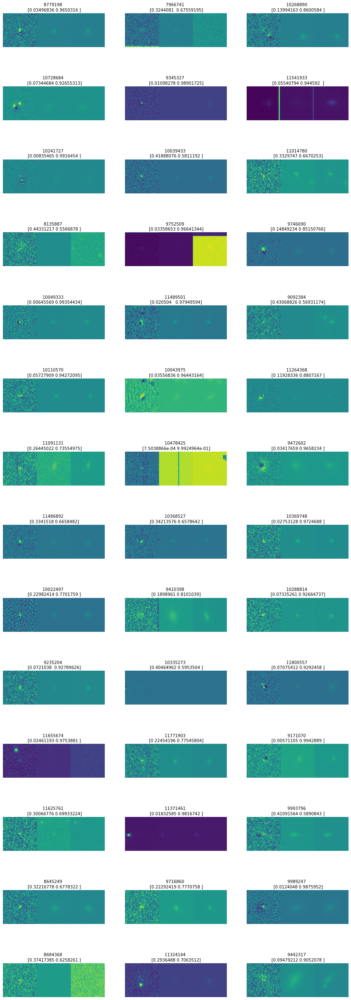

In [38]:
fig, ax = plt.subplots(14,3, figsize = (15,45))
#fig.subplots_adjust(0, 0, 0.5, 1, 0, 1)

for i in range(14*3):
    ax[i//3,i%3].axis("off")
    ax[i//3,i%3].imshow(test[df_test_mssreal.index.to_numpy()[i+126]])
    ax[i//3,i%3].set_title("{} \n {}".format(df_test_mssreal.loc[df_test_mssreal.index.to_numpy()[i+126]]["ID"],y_pred_test[df_test_mssreal.index.to_numpy()[i+126]] ), fontsize = 10)  
#plt.savefig("tests4.pdf",bbox_inches="tight")

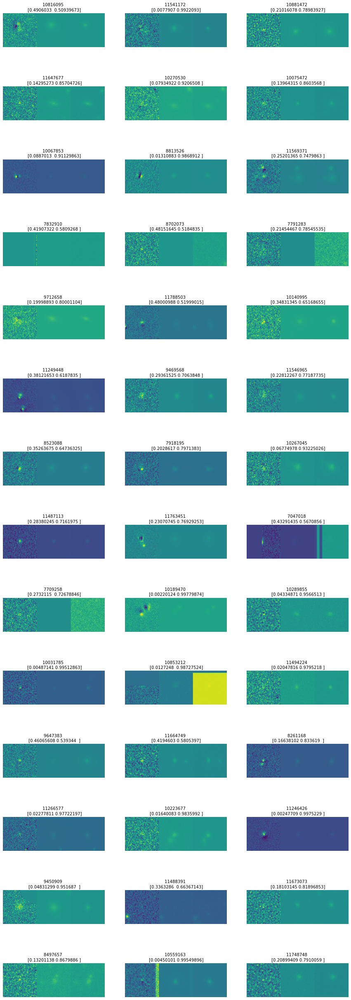

In [39]:
fig, ax = plt.subplots(14,3, figsize = (15,45))
#fig.subplots_adjust(0, 0, 0.5, 1, 0, 1)

for i in range(14*3):
    ax[i//3,i%3].axis("off")
    ax[i//3,i%3].imshow(test[df_test_mssreal.index.to_numpy()[i+168]])
    ax[i//3,i%3].set_title("{} \n {}".format(df_test_mssreal.loc[df_test_mssreal.index.to_numpy()[i+168]]["ID"],y_pred_test[df_test_mssreal.index.to_numpy()[i+168]] ), fontsize = 10)  
#plt.savefig("tests5.pdf",bbox_inches="tight")

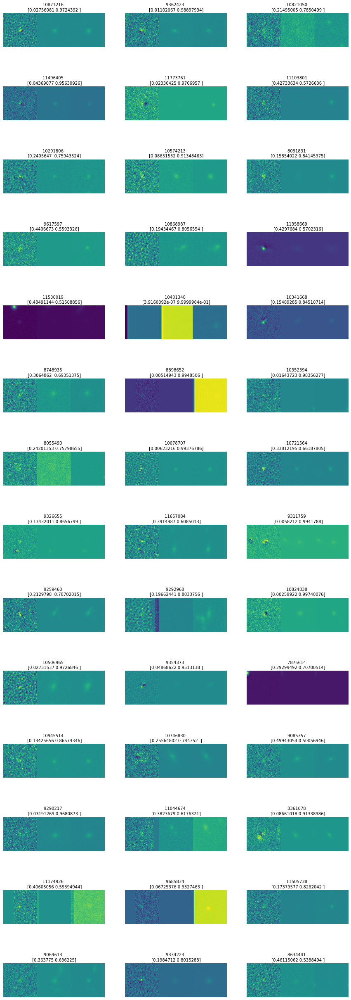

In [40]:
fig, ax = plt.subplots(14,3, figsize = (15,45))
#fig.subplots_adjust(0, 0, 0.5, 1, 0, 1)

for i in range(14*3):
    ax[i//3,i%3].axis("off")
    ax[i//3,i%3].imshow(test[df_test_mssreal.index.to_numpy()[i+210]])
    ax[i//3,i%3].set_title("{} \n {}".format(df_test_mssreal.loc[df_test_mssreal.index.to_numpy()[i+210]]["ID"],y_pred_test[df_test_mssreal.index.to_numpy()[i+210]] ), fontsize = 10)  
#plt.savefig("tests6.pdf",bbox_inches="tight")